# Whatsapp Group Chat Analysis 


### Importing required libraries

In [1]:
import numpy as np
import pandas as pd
import emoji
import matplotlib.pyplot as plt

In [44]:
import regex
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

### Reading the group chat file 

In [3]:
a=pd.read_csv(r"C:\Users\hp\Downloads\WhatsApp Chat with Brahma 2019-23.txt", delimiter = "\t", header = None, names = ['text'])

In [4]:
b=a.copy()

### Data Cleaning

In [5]:
a[['datetime_str', 'text_2']] = a["text"].str.split(" - ", 1, expand=True)
a["datetime"] = pd.to_datetime(a["datetime_str"],
                               format="%d/%m/%Y, %I:%M %p",
                               errors='coerce')
a[['sender', 'text_message']] = a['text_2'].str.split(': ', 1, expand=True)
a['first_name'] = a['sender'].str.split(' ', expand=True)[0]
a['last_name'] = a['sender'].str.split(' ', 1, expand=True)[1]
a['sender'] = a['first_name'].where(
    a['last_name'].isnull(), a['first_name'] + ' ' + a['last_name'].str[:])

In [6]:
a.tail()

,text,datetime_str,text_2,datetime,sender,text_message,first_name,last_name
17737,"08/12/20, 12:16 pm - Sahil: Anyone taking a pr...","08/12/20, 12:16 pm",Sahil: Anyone taking a project of AppD? Langua...,NaT,Sahil,Anyone taking a project of AppD? Language: Jav...,Sahil,None
17738,"10/12/20, 8:33 am - +91 94589 13826: Ye Course...","10/12/20, 8:33 am",+91 94589 13826: Ye Coursera pe apne ko 6 cour...,NaT,+91 94589 13826,Ye Coursera pe apne ko 6 courses hi authorised...,+91,94589 13826
17739,"10/12/20, 8:33 am - +91 94589 13826: Institute...","10/12/20, 8:33 am",+91 94589 13826: Institute ki taraf se I mean,NaT,+91 94589 13826,Institute ki taraf se I mean,+91,94589 13826
17740,"10/12/20, 8:35 am - +91 95996 24291: Yup","10/12/20, 8:35 am",+91 95996 24291: Yup,NaT,+91 95996 24291,Yup,+91,95996 24291
17741,"10/12/20, 10:00 am - +91 87770 12348: ?","10/12/20, 10:00 am",+91 87770 12348: ?,NaT,+91 87770 12348,?,+91,87770 12348


In [7]:
a['date_col'] = pd.to_datetime(a['datetime_str'])

In [8]:
a['Date'] = a['date_col'].dt.date
a['Time'] = a['date_col'].dt.strftime('%H:%M')
a.head()

,text,datetime_str,text_2,datetime,sender,text_message,first_name,last_name,date_col,Date,Time
0,"29/07/19, 11:18 am - Messages and calls are en...","29/07/19, 11:18 am",Messages and calls are end-to-end encrypted. N...,NaT,Messages and calls are end-to-end encrypted. N...,None,Messages,and calls are end-to-end encrypted. No one out...,2019-07-29 11:18:00,2019-07-29,11:18
1,"18/07/19, 6:09 pm - Aman Bhaiya Sports Sec cre...","18/07/19, 6:09 pm","Aman Bhaiya Sports Sec created group ""Brahmapu...",NaT,"Aman Bhaiya Sports Sec created group ""Brahmapu...",None,Aman,"Bhaiya Sports Sec created group ""Brahmaputra h...",2019-07-18 18:09:00,2019-07-18,18:09
2,"29/07/19, 11:18 am - You joined using this gro...","29/07/19, 11:18 am",You joined using this group's invite link,NaT,You joined using this group's invite link,None,You,joined using this group's invite link,2019-07-29 11:18:00,2019-07-29,11:18
3,"29/07/19, 11:32 am - Varenya: Can I have full ...","29/07/19, 11:32 am",Varenya: Can I have full Ed kit not just drafter,NaT,Varenya,Can I have full Ed kit not just drafter,Varenya,None,2019-07-29 11:32:00,2019-07-29,11:32
4,"29/07/19, 12:12 pm - Aman Bhaiya Sports Sec: T...","29/07/19, 12:12 pm",Aman Bhaiya Sports Sec: This message was deleted,NaT,Aman Bhaiya Sports Sec,This message was deleted,Aman,Bhaiya Sports Sec,2019-07-29 12:12:00,2019-07-29,12:12


In [9]:
a.tail()

,text,datetime_str,text_2,datetime,sender,text_message,first_name,last_name,date_col,Date,Time
17737,"08/12/20, 12:16 pm - Sahil: Anyone taking a pr...","08/12/20, 12:16 pm",Sahil: Anyone taking a project of AppD? Langua...,NaT,Sahil,Anyone taking a project of AppD? Language: Jav...,Sahil,None,2020-08-12 12:16:00,2020-08-12,12:16
17738,"10/12/20, 8:33 am - +91 94589 13826: Ye Course...","10/12/20, 8:33 am",+91 94589 13826: Ye Coursera pe apne ko 6 cour...,NaT,+91 94589 13826,Ye Coursera pe apne ko 6 courses hi authorised...,+91,94589 13826,2020-10-12 08:33:00,2020-10-12,08:33
17739,"10/12/20, 8:33 am - +91 94589 13826: Institute...","10/12/20, 8:33 am",+91 94589 13826: Institute ki taraf se I mean,NaT,+91 94589 13826,Institute ki taraf se I mean,+91,94589 13826,2020-10-12 08:33:00,2020-10-12,08:33
17740,"10/12/20, 8:35 am - +91 95996 24291: Yup","10/12/20, 8:35 am",+91 95996 24291: Yup,NaT,+91 95996 24291,Yup,+91,95996 24291,2020-10-12 08:35:00,2020-10-12,08:35
17741,"10/12/20, 10:00 am - +91 87770 12348: ?","10/12/20, 10:00 am",+91 87770 12348: ?,NaT,+91 87770 12348,?,+91,87770 12348,2020-10-12 10:00:00,2020-10-12,10:00


In [10]:
a.drop(
    ['text', 'datetime_str', 'text_2', 'datetime', 'first_name', 'last_name'],
    axis=1,
    inplace=True)

In [11]:
a

,sender,text_message,date_col,Date,Time
0,Messages and calls are end-to-end encrypted. N...,None,2019-07-29 11:18:00,2019-07-29,11:18
1,"Aman Bhaiya Sports Sec created group ""Brahmapu...",None,2019-07-18 18:09:00,2019-07-18,18:09
2,You joined using this group's invite link,None,2019-07-29 11:18:00,2019-07-29,11:18
3,Varenya,Can I have full Ed kit not just drafter,2019-07-29 11:32:00,2019-07-29,11:32
4,Aman Bhaiya Sports Sec,This message was deleted,2019-07-29 12:12:00,2019-07-29,12:12
...,...,...,...,...,...
17737,Sahil,Anyone taking a project of AppD? Language: Jav...,2020-08-12 12:16:00,2020-08-12,12:16
17738,+91 94589 13826,Ye Coursera pe apne ko 6 courses hi authorised...,2020-10-12 08:33:00,2020-10-12,08:33
17739,+91 94589 13826,Institute ki taraf se I mean,2020-10-12 08:33:00,2020-10-12,08:33
17740,+91 95996 24291,Yup,2020-10-12 08:35:00,2020-10-12,08:35


## Data Visualization

### Heatmap for Hour of Day v/s Day of week

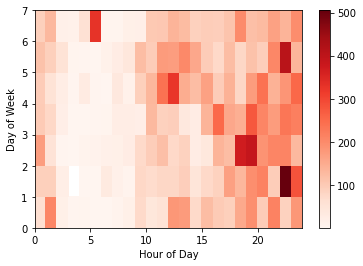

In [12]:
a['day_of_week'] = a['date_col'].dt.dayofweek + 1
a['hour_of_day'] = a['date_col'].dt.hour

# Create new Dataframe containing data counts
heatmap_data = a.groupby(['day_of_week', 'hour_of_day']).size()
heatmap_data = heatmap_data.unstack()

# Create heatmap
plt.pcolor(heatmap_data, cmap='Reds')
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.colorbar()
plt.show()

### Bar Chart for sender message count

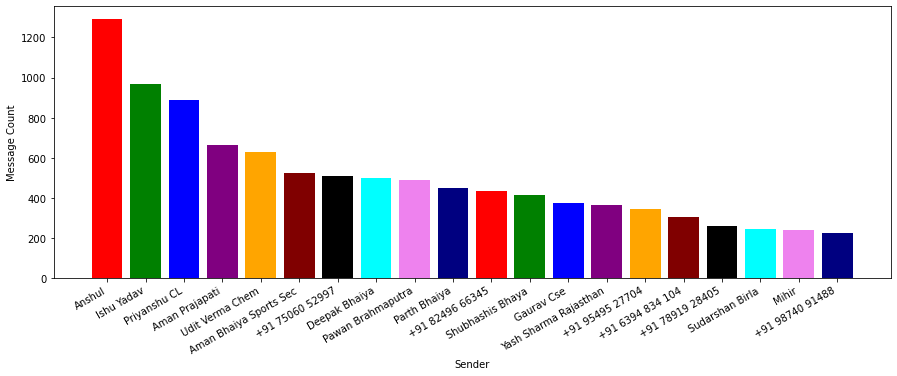

In [46]:
sender_count_series = a.groupby(['sender']).size().sort_values(ascending=False).head(20)

# Create sender counts series as a DataFrame
sender_count_df = pd.DataFrame(sender_count_series)

# Reset index in order to name columns correctly
sender_count_df = sender_count_df.reset_index()
sender_count_df.columns = ['sender', 'count']

# Plot bar chart with sender message counts
plt.figure(figsize=(15, 5))
New_Colors = ['red','green','blue','purple','orange','maroon','black','cyan','violet','navy']
plt.bar(sender_count_df['sender'], sender_count_df['count'], color = New_Colors )
plt.xlabel("Sender")
plt.ylabel("Message Count")
plt.xticks(rotation=30, ha="right")
plt.show()

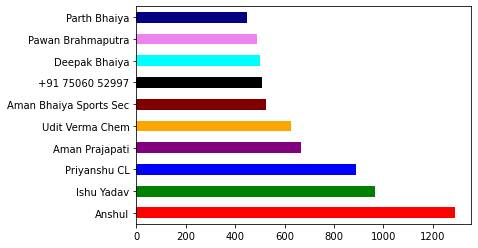

In [15]:
author_value_counts = a['sender'].value_counts() 
top_10_author_value_counts = author_value_counts.head(10) 
top_10_author_value_counts.plot.barh(color = New_Colors)

In [47]:
top_10_author_value_counts

Anshul                    1291
Ishu Yadav                 966
Priyanshu CL               889
Aman Prajapati             665
Udit Verma Chem            626
Aman Bhaiya Sports Sec     523
+91 75060 52997            508
Deepak Bhaiya              501
Pawan Brahmaputra          489
Parth Bhaiya               447
Name: sender, dtype: int64

#### Manipulation : Replacing null message and spamming blank space message with 'Jai Brahma'

In [17]:
a['text_message'] = a['text_message'].replace(np.nan, 'Jai Brahma')

### Most used Emoji's 

In [31]:
emojis = pd.DataFrame(columns=['sender','emoji','date_col'])

# Loop through all messages in the DataFrame
for sender, message, date_col in zip(a.sender, a.text_message, a.date_col):

  # Split out each word in each message
  message_split = list(message)
 
  # Loop through each word in split message
  for character in message_split:
 
    # If the word is an emoji
    if character in emoji.UNICODE_EMOJI and character != "\U0001f3fc":
 
      # Add each emoji to the DataFrame
      emojis = emojis.append({'sender' : sender, 'emoji' : character, 'date_col' : date_col}, ignore_index=True)

# Display top n most popular emojis
emojis.groupby(['emoji']).size().sort_values(ascending=False).head(10)

emoji
😂    1760
🤣     960
🤮     370
🔥     353
🥳     285
❤     244
🏻     209
🎉     190
😍     142
👍     131
dtype: int64

### Group Wise Stats

In [20]:
import re

In [49]:
def split_count(text):

    emoji_list = []
    data = regex.findall(r'\X', text)
    for word in data:
        if any(char in emoji.UNICODE_EMOJI for char in word):
            emoji_list.append(word)

    return emoji_list


total_messages = a.shape[0]
media_messages = a[a['text_message'] == '<Media omitted>'].shape[0]
a["emoji"] = a["text_message"].apply(split_count)
emojis = sum(a['emoji'].str.len())
URLPATTERN = r'(https?://\S+)'
a['urlcount'] = a.text_message.apply(
    lambda x: re.findall(URLPATTERN, x)).str.len()
links = np.sum(a.urlcount)

#### Total messages in group

In [50]:
total_messages

17742

#### Total media messages

In [51]:
media_messages

2510

#### Total emojis used

In [52]:
emojis

7525

#### Total links sent

In [53]:
links

423

### Omitting Media messages

In [26]:
media_messages_df = a[a['text_message'] == '<Media omitted>']
messages_df = a.drop(media_messages_df.index)

In [27]:
messages_df['Letter_Count'] = messages_df['text_message'].apply(
    lambda s: len(s))
messages_df['Word_Count'] = messages_df['text_message'].apply(
    lambda s: len(s.split(' ')))

In [28]:
messages_df

,sender,text_message,date_col,Date,Time,day_of_week,hour_of_day,emoji,urlcount,Letter_Count,Word_Count
0,Messages and calls are end-to-end encrypted. N...,Jai Brahma,2019-07-29 11:18:00,2019-07-29,11:18,1,11,[],0,10,2
1,"Aman Bhaiya Sports Sec created group ""Brahmapu...",Jai Brahma,2019-07-18 18:09:00,2019-07-18,18:09,4,18,[],0,10,2
2,You joined using this group's invite link,Jai Brahma,2019-07-29 11:18:00,2019-07-29,11:18,1,11,[],0,10,2
3,Varenya,Can I have full Ed kit not just drafter,2019-07-29 11:32:00,2019-07-29,11:32,1,11,[],0,39,9
4,Aman Bhaiya Sports Sec,This message was deleted,2019-07-29 12:12:00,2019-07-29,12:12,1,12,[],0,24,4
...,...,...,...,...,...,...,...,...,...,...,...
17737,Sahil,Anyone taking a project of AppD? Language: Jav...,2020-08-12 12:16:00,2020-08-12,12:16,3,12,[],0,53,10
17738,+91 94589 13826,Ye Coursera pe apne ko 6 courses hi authorised...,2020-10-12 08:33:00,2020-10-12,08:33,1,8,[],0,55,11
17739,+91 94589 13826,Institute ki taraf se I mean,2020-10-12 08:33:00,2020-10-12,08:33,1,8,[],0,28,6
17740,+91 95996 24291,Yup,2020-10-12 08:35:00,2020-10-12,08:35,1,8,[],0,3,1


### Sender wise Stats

In [29]:
l = messages_df.sender.unique()

for i in range(len(l)):
    # Filtering out messages of particular user
    req_df = messages_df[messages_df["sender"] == l[i]]
    # req_df will contain messages of only one particular user
    print(f'Stats of {l[i]} -')
    # shape will print number of rows which indirectly means the number of messages
    print('Messages Sent', req_df.shape[0])
    #Word_Count contains of total words in one message. Sum of all words/ Total Messages will yield words per message
    words_per_message = (np.sum(req_df['Word_Count'])) / req_df.shape[0]
    print('Words per message', words_per_message)
    #media conists of media messages
    media = media_messages_df[media_messages_df['sender'] == l[i]].shape[0]
    print('Media Messages Sent', media)
    # emojis conists of total emojis
    emojis = sum(req_df['emoji'].str.len())
    print('Emojis Sent', emojis)
    #links consist of total links
    links = sum(req_df["urlcount"])
    print('Links Sent', links)
    print()

Stats of Messages and calls are end-to-end encrypted. No one outside of this chat, not even WhatsApp, can read or listen to them. Tap to learn more. -
Messages Sent 1
Words per message 2.0
Media Messages Sent 0
Emojis Sent 0
Links Sent 0

Stats of Aman Bhaiya Sports Sec created group "Brahmaputra hostel group" -
Messages Sent 1
Words per message 2.0
Media Messages Sent 0
Emojis Sent 0
Links Sent 0

Stats of You joined using this group's invite link -
Messages Sent 1
Words per message 2.0
Media Messages Sent 0
Emojis Sent 0
Links Sent 0

Stats of Varenya -
Messages Sent 125
Words per message 3.152
Media Messages Sent 29
Emojis Sent 313
Links Sent 2

Stats of Aman Bhaiya Sports Sec -
Messages Sent 479
Words per message 13.315240083507307
Media Messages Sent 44
Emojis Sent 52
Links Sent 17

Stats of Priyanshu CL -
Messages Sent 848
Words per message 6.047169811320755
Media Messages Sent 41
Emojis Sent 319
Links Sent 11

Stats of +91 99401 09429 -
Messages Sent 107
Words per message 4.4859

In [55]:
#emojis.groupby(['emoji']).size().sort_values(ascending=False)

### Total count of words in all messages

In [33]:
text = " ".join(review for review in messages_df.text_message)
print ("There are {} words in all the messages.".format(len(text)))

There are 525102 words in all the messages.


### Wordcloud of most used words

In [34]:
from wordcloud import WordCloud

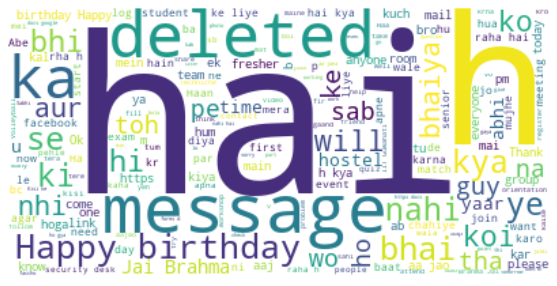

In [35]:
wordcloud = WordCloud(background_color="white").generate(text)
plt.figure( figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Most happening day

In [36]:
date_df = messages_df.groupby("Date").sum()
date_df.reset_index(inplace=True)
date_df.head()

,Date,day_of_week,hour_of_day,urlcount,Letter_Count,Word_Count
0,2019-01-08,388,2419,4,5746,1059
1,2019-01-09,1620,10065,1,6492,1208
2,2019-01-10,40,163,1,626,103
3,2019-01-11,85,350,0,952,188
4,2019-01-12,78,160,0,635,123


Text(0, 0.5, 'Date')

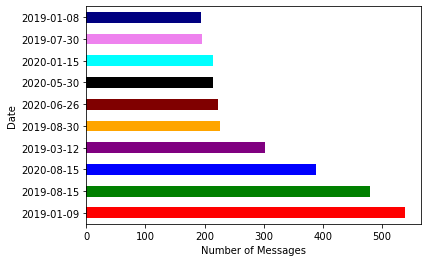

In [37]:
messages_df['Date'].value_counts().head(10).plot.barh(color = New_Colors)
plt.xlabel('Number of Messages')
plt.ylabel('Date')

### Most happening time

Text(0, 0.5, 'Time')

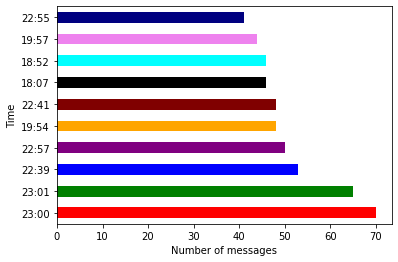

In [38]:
messages_df['Time'].value_counts().head(10).plot.barh(color = New_Colors)
plt.xlabel('Number of messages')
plt.ylabel('Time')

### Number of words used by top 10 Senders

Text(0, 0.5, 'sender')

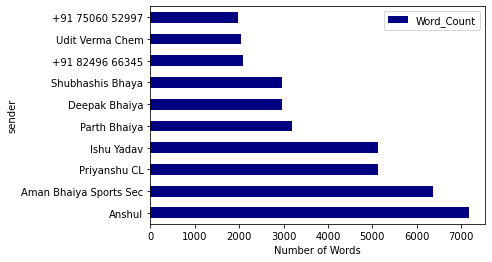

In [103]:
total_word_count_grouped_by_author = messages_df[['sender', 'Word_Count'
                                                  ]].groupby('sender').sum()
sorted_total_word_count_grouped_by_author = total_word_count_grouped_by_author.sort_values(
    'Word_Count', ascending=False)
top_10_sorted_total_word_count_grouped_by_author = sorted_total_word_count_grouped_by_author.head(
    10)
top_10_sorted_total_word_count_grouped_by_author.plot.barh(color='navy')
plt.xlabel('Number of Words')
plt.ylabel('sender')

In [54]:
#req_df

### Top words used by all group members

Sender Messages and calls are end-to-end encrypted. No one outside of this chat, not even WhatsApp, can read or listen to them. Tap to learn more.


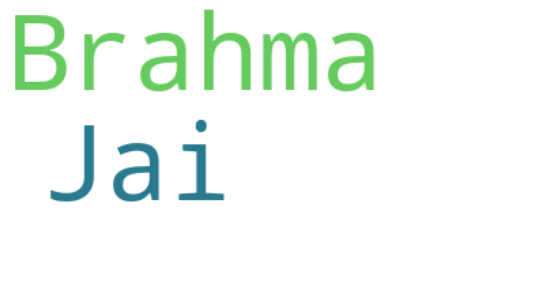

Sender Aman Bhaiya Sports Sec created group "Brahmaputra hostel group"


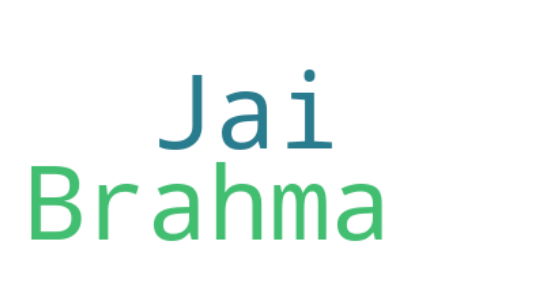

Sender You joined using this group's invite link


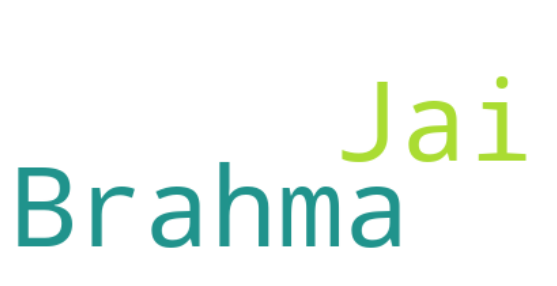

Sender Varenya


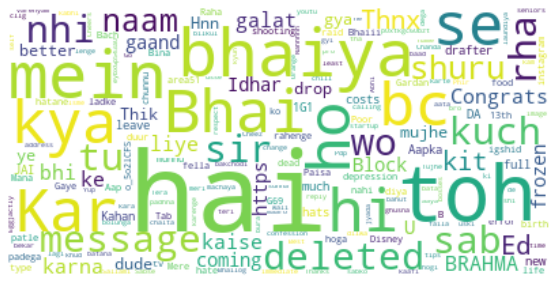

Sender Aman Bhaiya Sports Sec


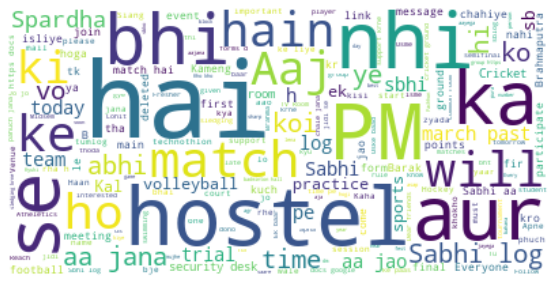

Sender Priyanshu CL


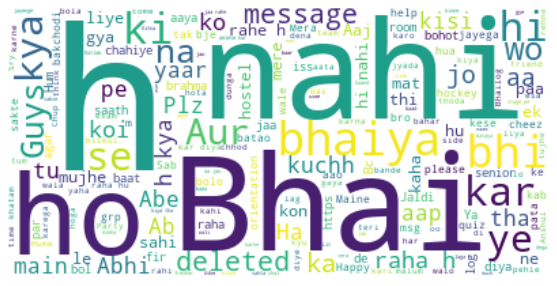

Sender +91 99401 09429


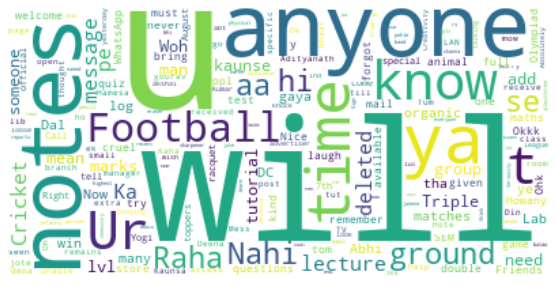

Sender Yash Sharma Rajasthan


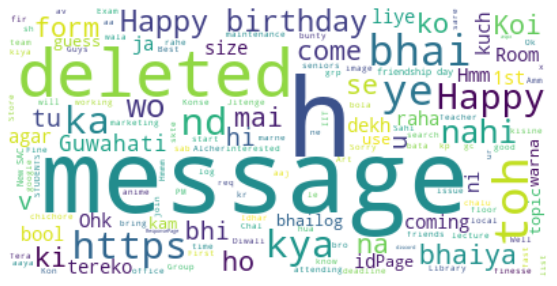

Sender Shubham MNC


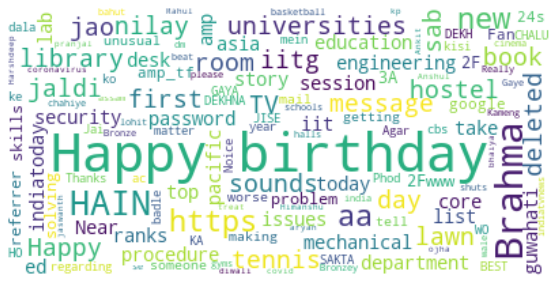

Sender +91 72648 25765


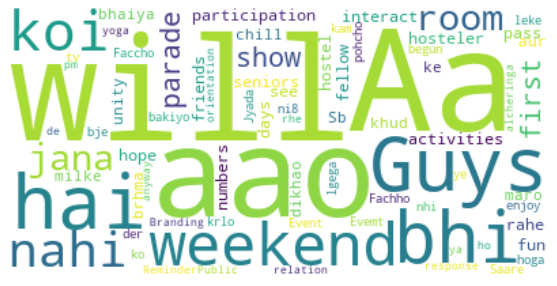

Sender Udit Verma Chem


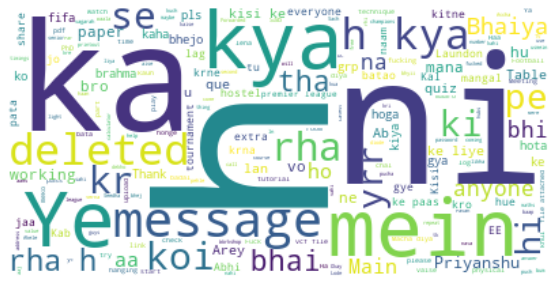

Sender Ankit Pujari


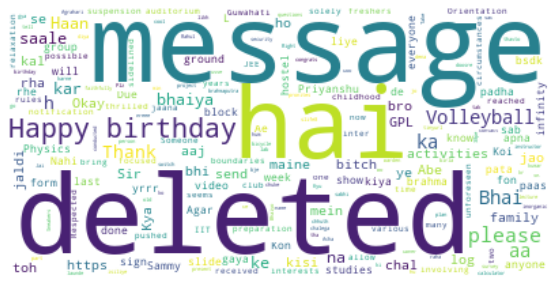

Sender Abhijeet Cl


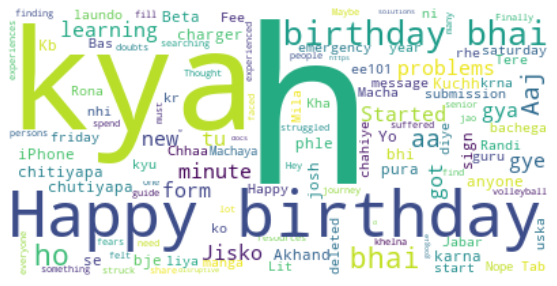

Sender +91 83770 83214


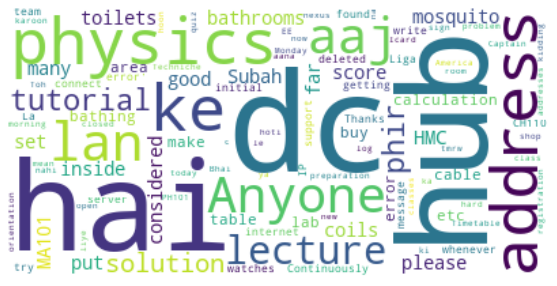

Sender +91 91400 31208


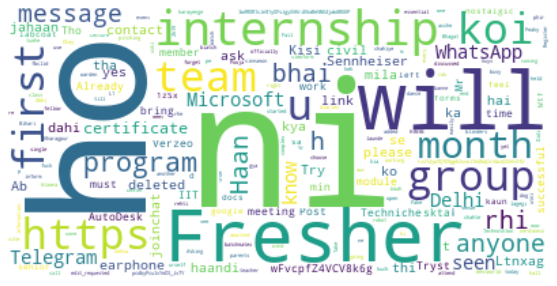

Sender +91 78919 28405


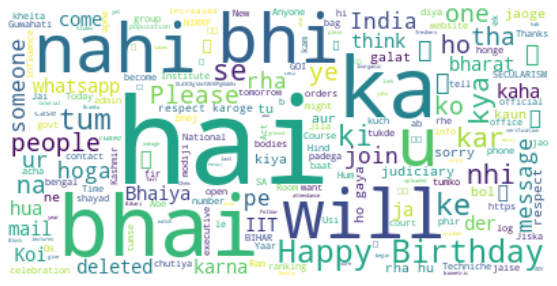

Sender Gaurav Cse


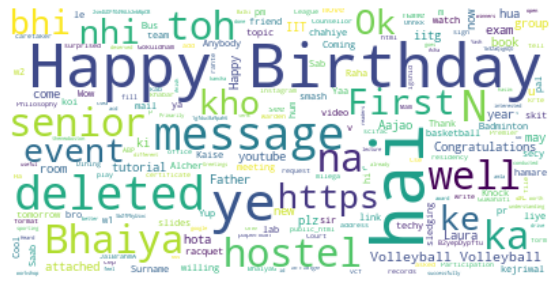

Sender +91 84400 28874


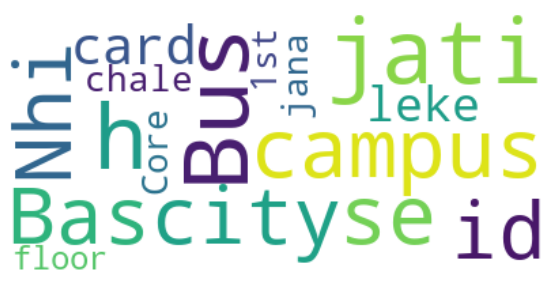

Sender Shubhashis Bhaya


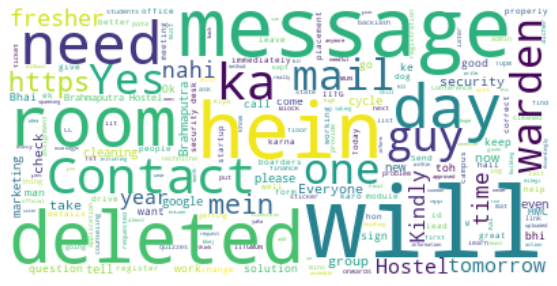

Sender Deepak Bhaiya


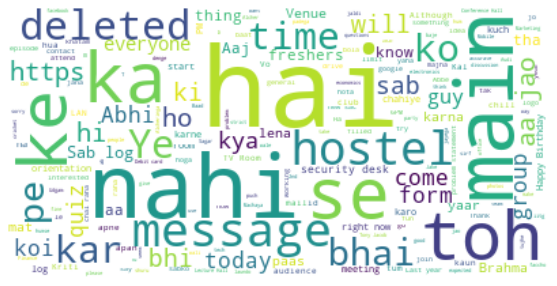

Sender +91 98740 91488


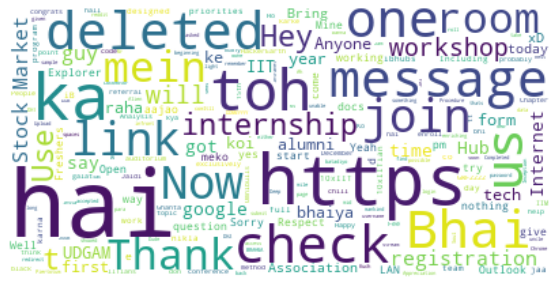

Sender Deepak Bhaiya changed the subject from "Brahmaputra hostel group" to "BrahmaputraFreshers_19-23"


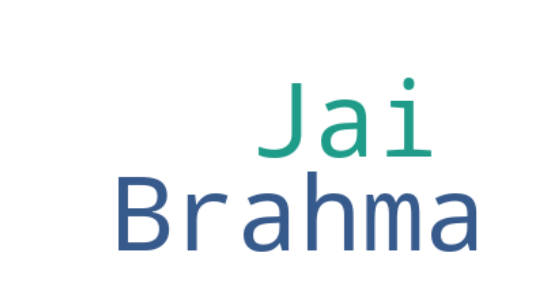

Sender +91 94228 84427


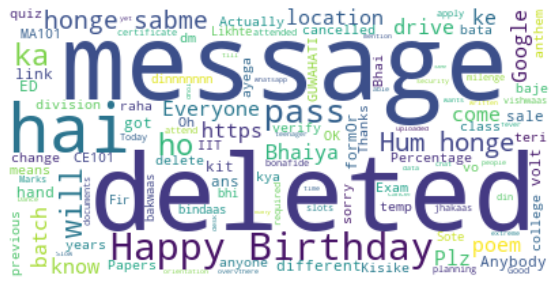

Sender Franshu


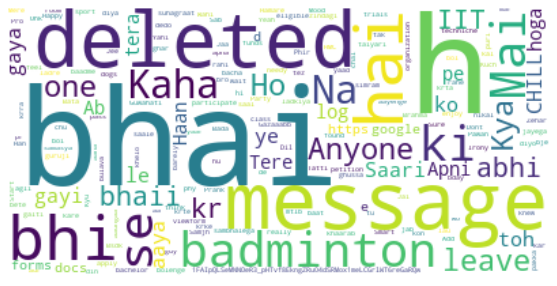

Sender Ishu Yadav


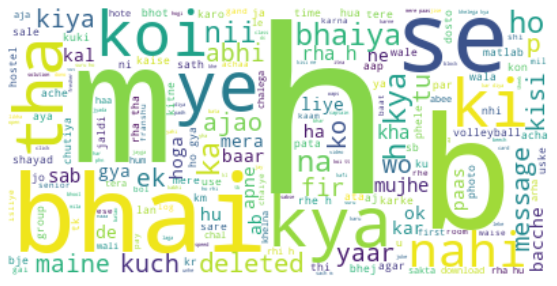

Sender +91 79956 99139


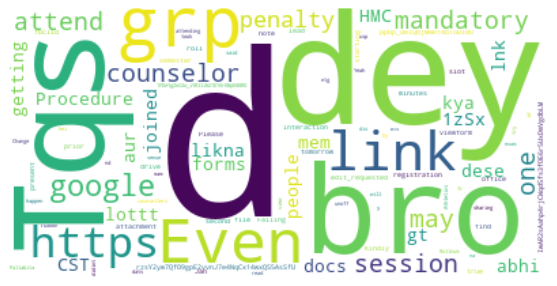

Sender +91 76967 60066


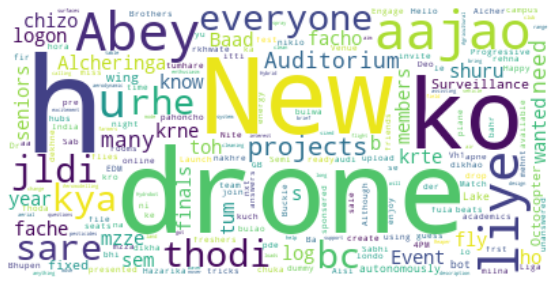

Sender +91 72279 66049


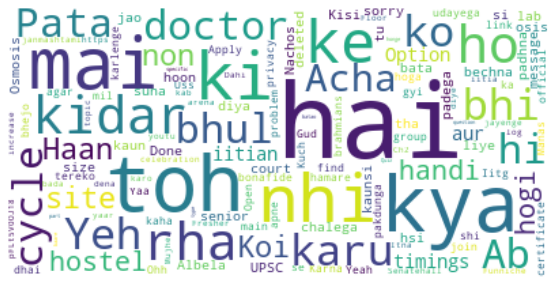

Sender +91 98769 37639 joined using this group's invite link


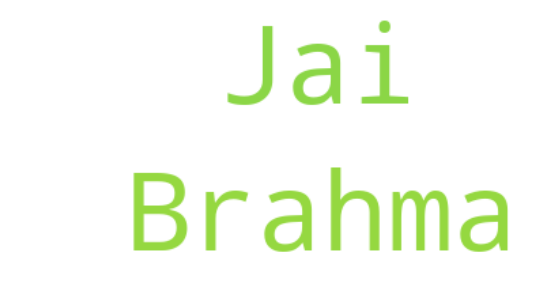

Sender Himanshu Itoria


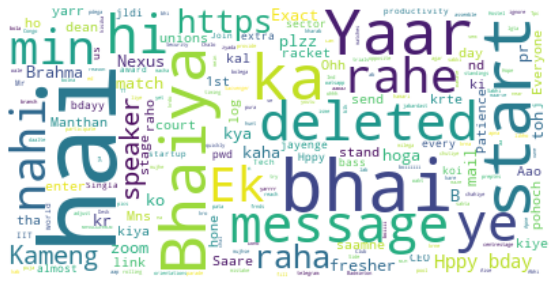

Sender +91 82496 66345


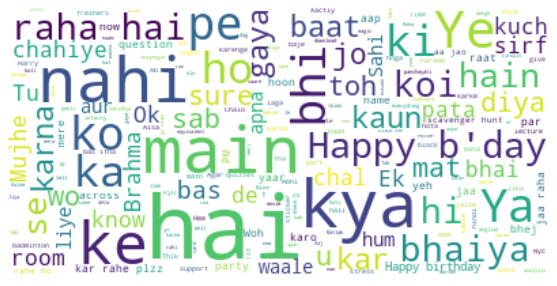

Sender +91 82248 05026 left


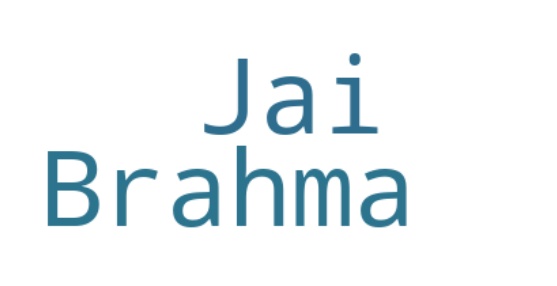

Sender +91 93543 76887


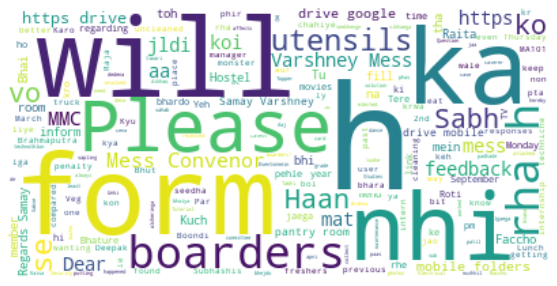

Sender +91 75060 52997


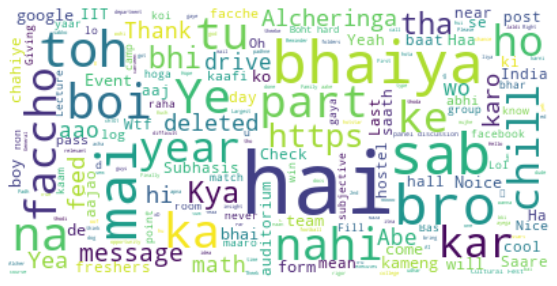

Sender +91 73803 47905


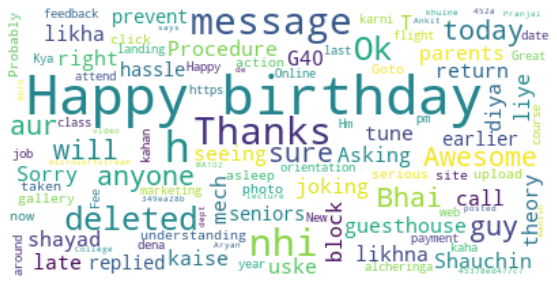

Sender +91 80187 83345


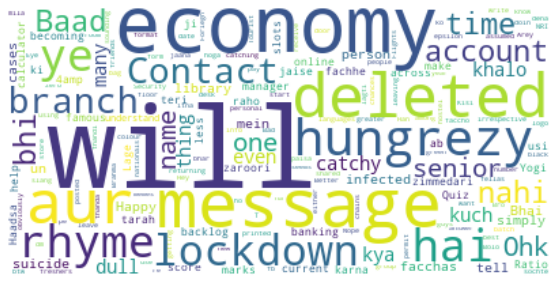

Sender +91 91006 06234


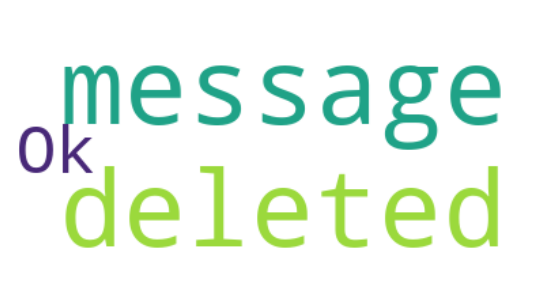

Sender Yatin Bhaiya


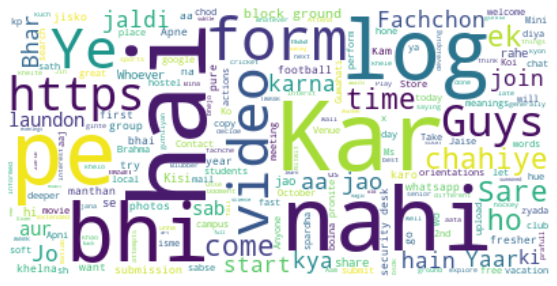

Sender Mihir


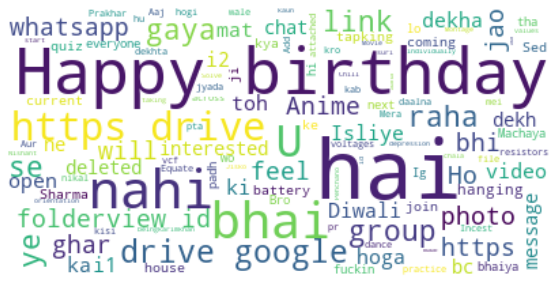

Sender +91 82501 89252


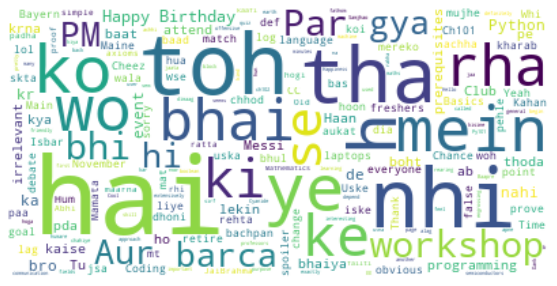

Sender +91 84802 65700


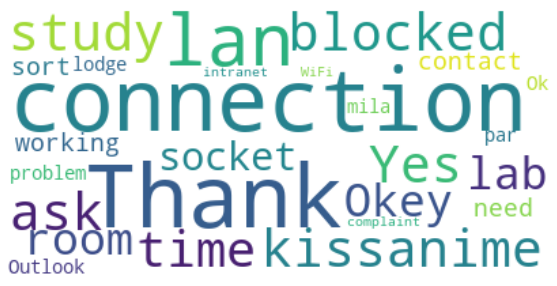

Sender Parth Bhaiya


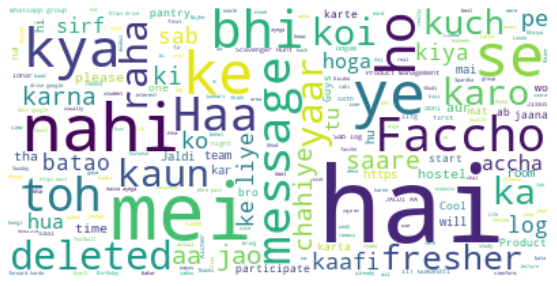

Sender +91 99993 30576


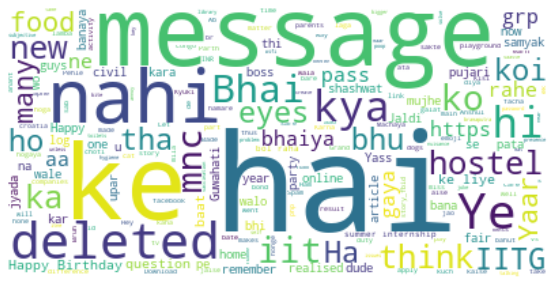

Sender +91 88809 50159


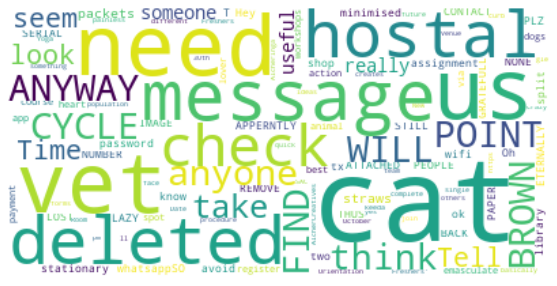

Sender Yash Sisodia


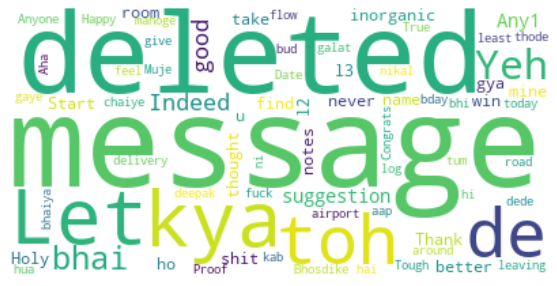

Sender +91 98769 37639


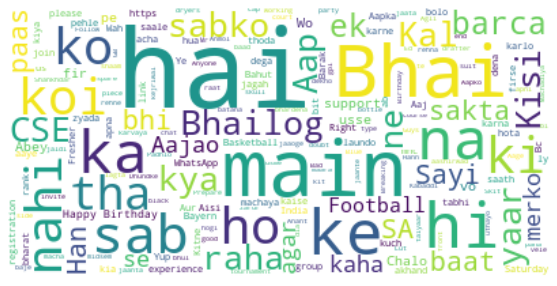

Sender +91 6203 674 517


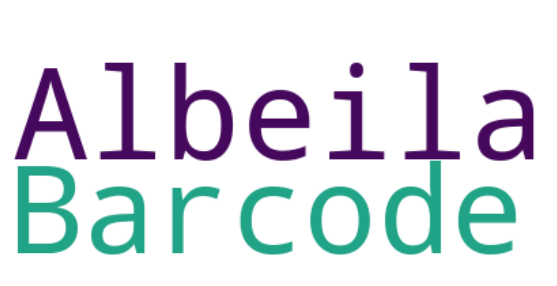

Sender +91 86960 11111


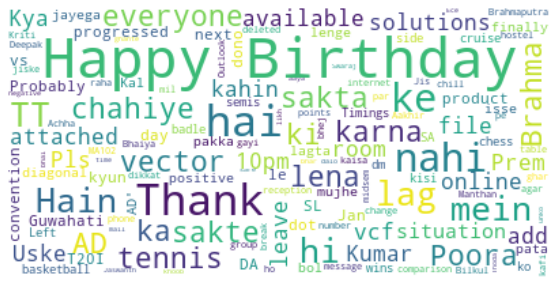

Sender +91 95495 27704


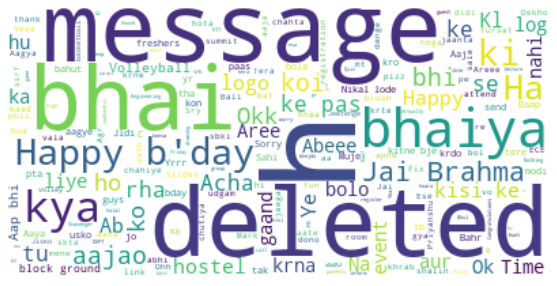

Sender +91 6360 344 648


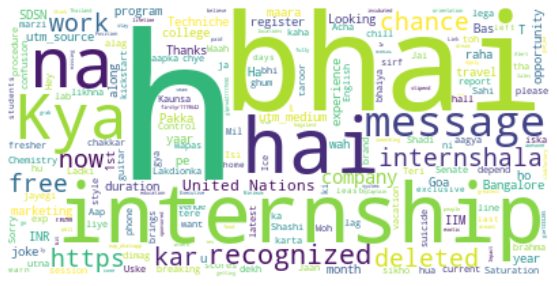

Sender Praveen Brahma


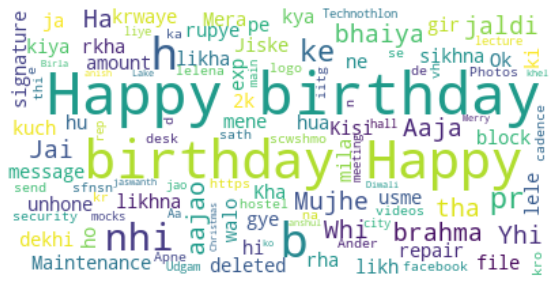

Sender +91 79831 81893 joined using this group's invite link


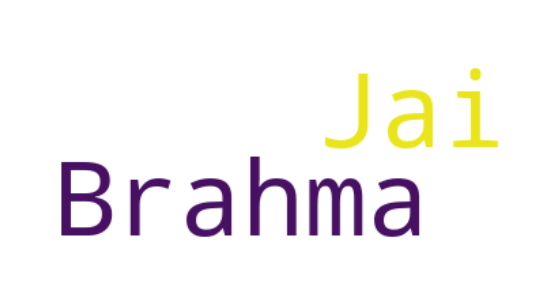

Sender +91 90790 99939 added +91 94864 57303


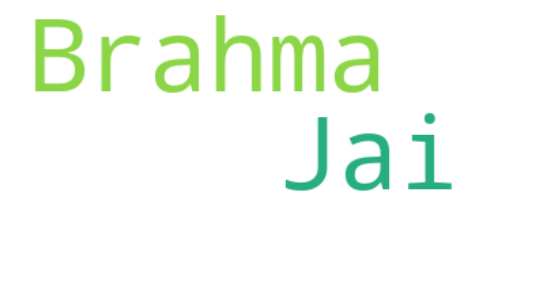

Sender Harshdeep Sahu


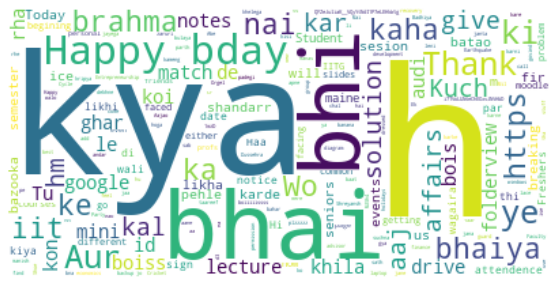

Sender +91 75969 98932


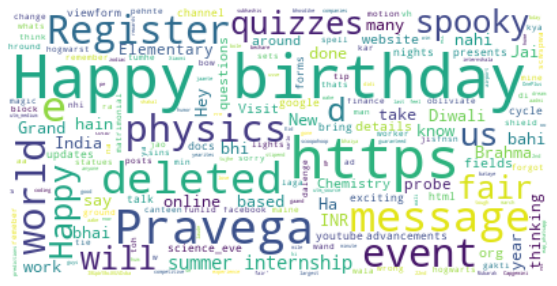

Sender +91 99551 74115


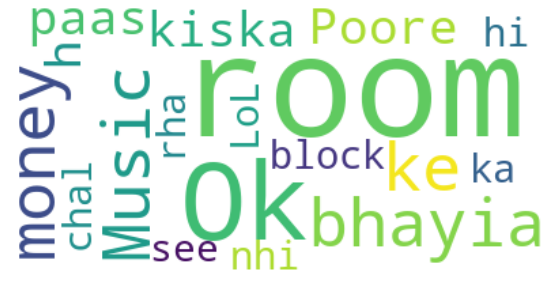

Sender Shasank BT


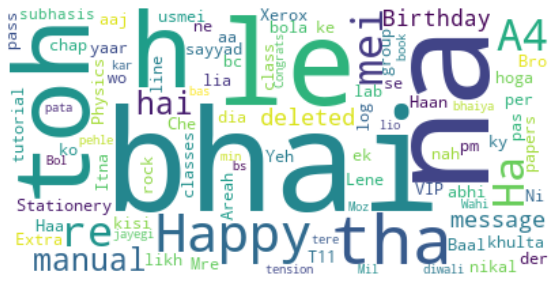

Sender +91 97926 51009


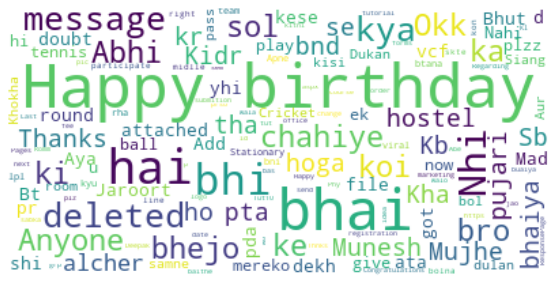

Sender Shubhashis Bhaya added +91 99604 54439


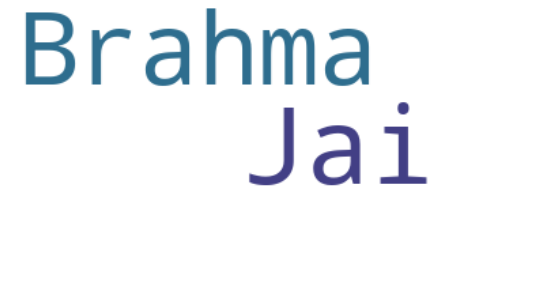

Sender +91 99670 68282 joined using this group's invite link


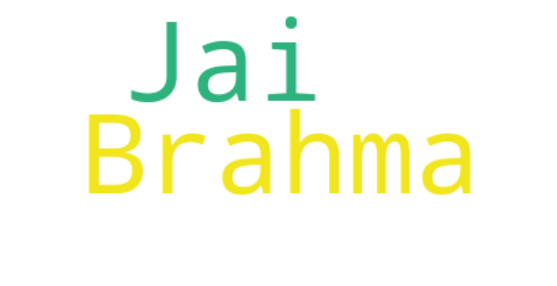

Sender +91 87896 36492


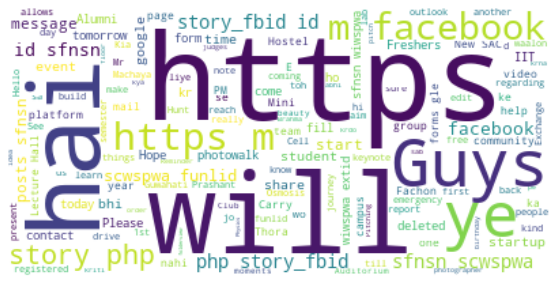

Sender +91 99834 78888


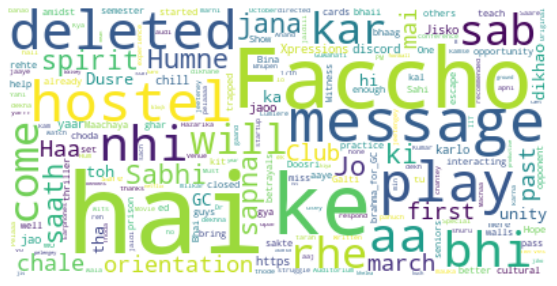

Sender +91 99604 54439


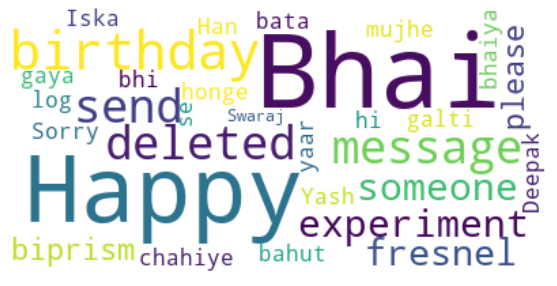

Sender +91 6203 674 517 changed to +91 84728 92041


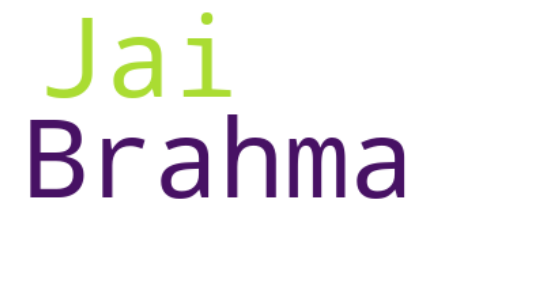

Sender Rohit R Ep


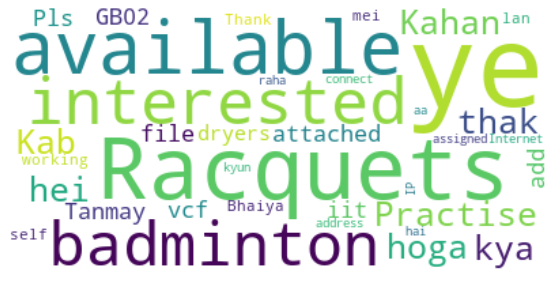

Sender +91 85049 66052


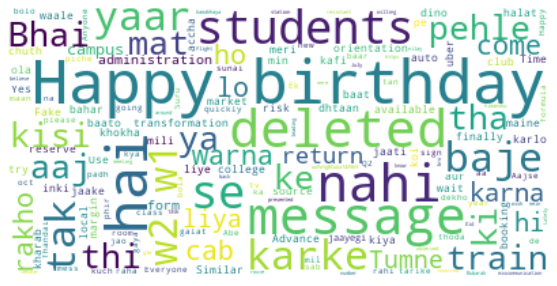

Sender +91 99670 68282


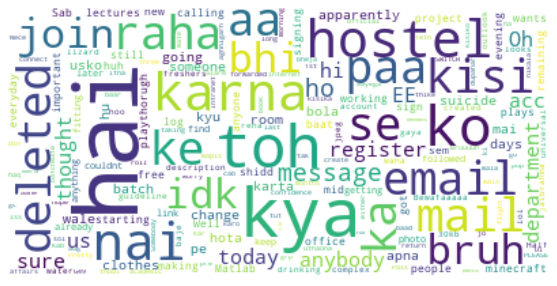

Sender +91 93814 45603 added +91 95733 84138


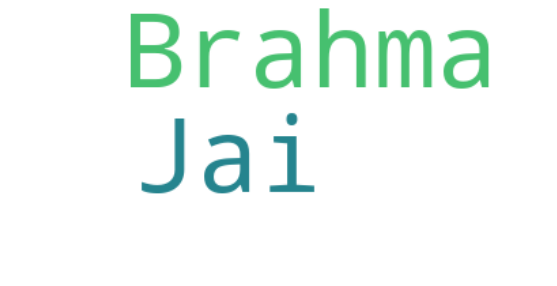

Sender +91 95733 84138 added +91 6371 114 763 and +91 76378 34925


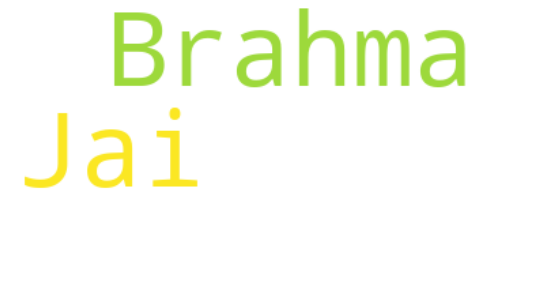

Sender Swaraj


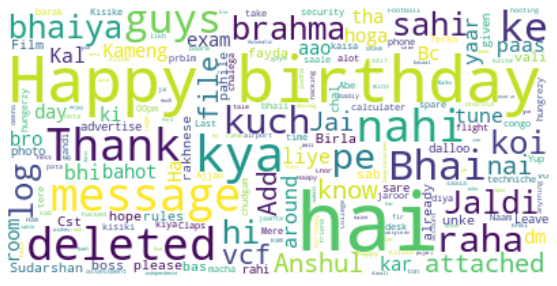

Sender Shubhashis Bhaya added Sudarshan Birla


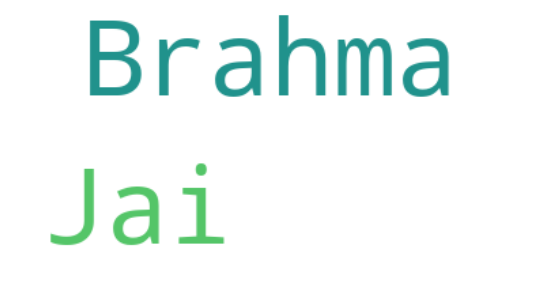

Sender +91 98871 41334


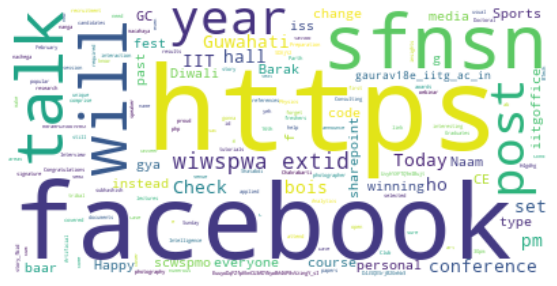

Sender +91 94938 70958


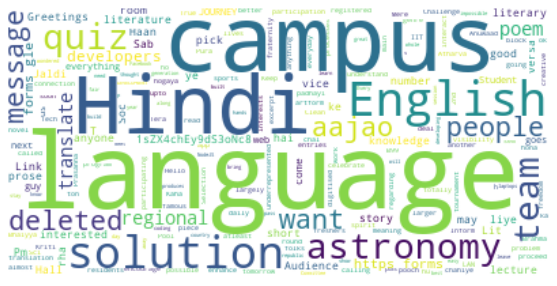

Sender Aman Prajapati


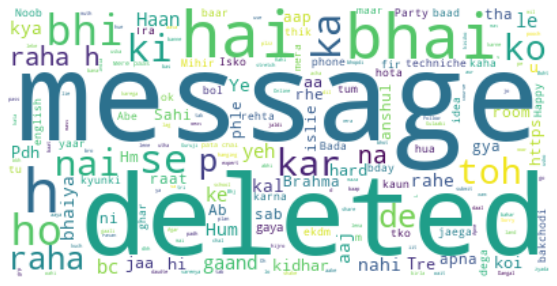

Sender +91 97280 75624 changed to +91 89552 75677


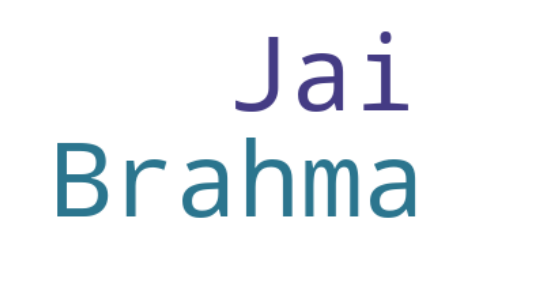

Sender +91 94589 13826


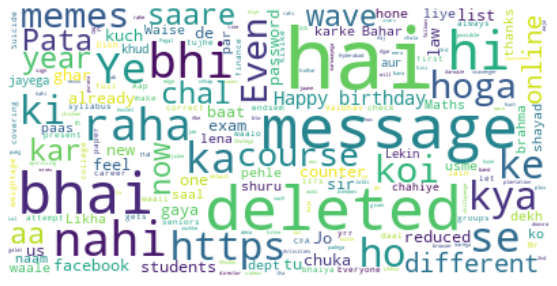

Sender Sudarshan Birla


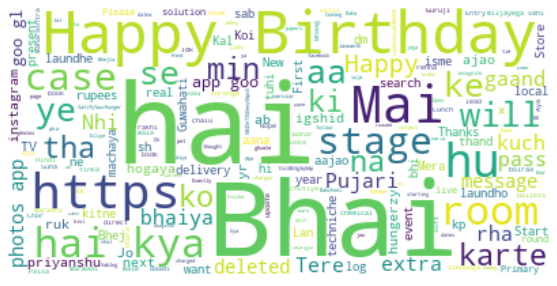

Sender +91 60008 45011


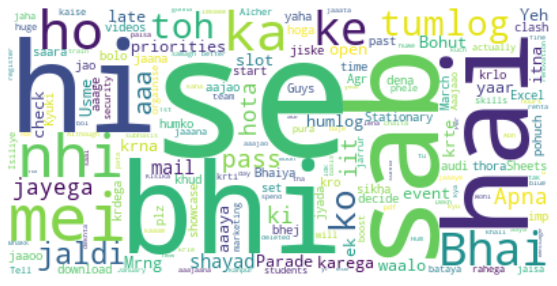

Sender +91 99784 57831


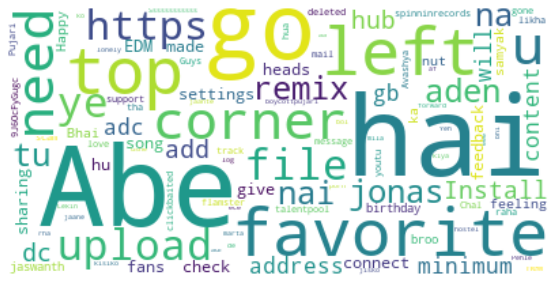

Sender +91 85007 87788


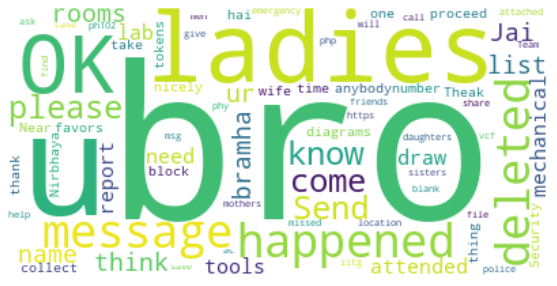

Sender +91 93654 58709


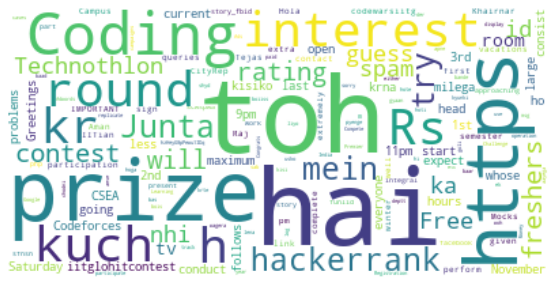

Sender +91 93730 42360


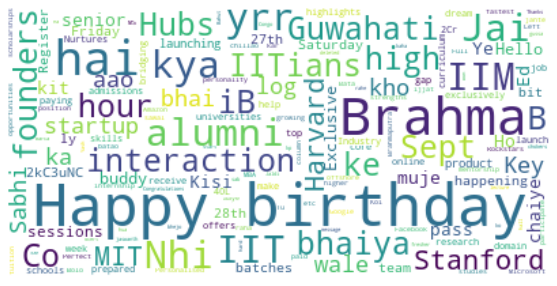

Sender +91 80803 87383


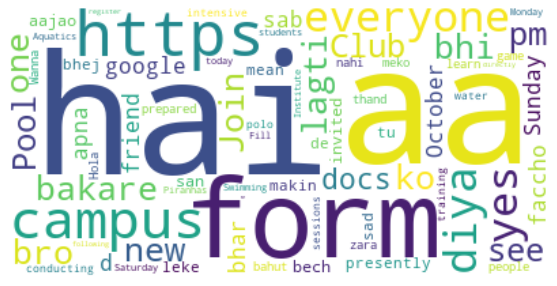

Sender +91 87896 76159


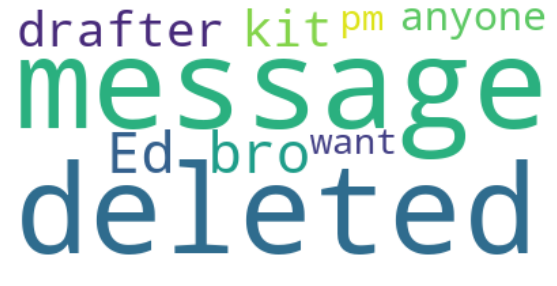

Sender +91 70326 61060


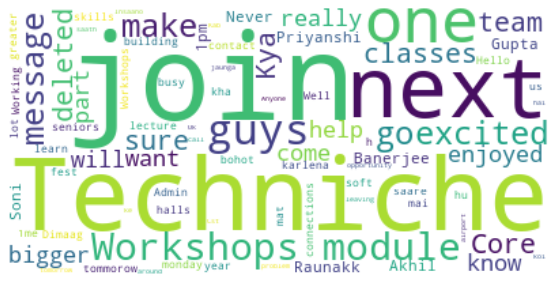

Sender Pranjal Verma


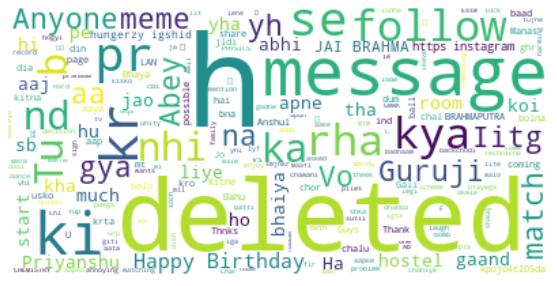

Sender Sahil


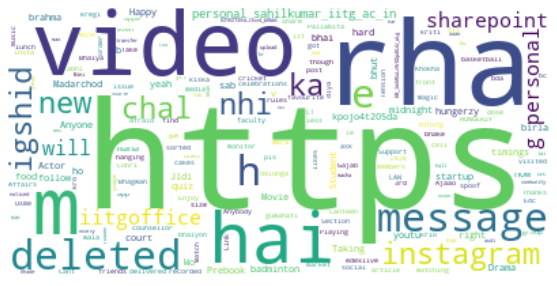

Sender Tanmay Thakur IITG


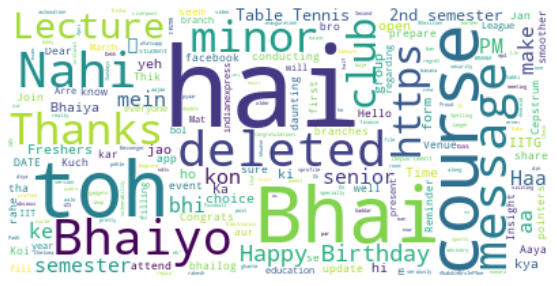

Sender +91 96431 35319


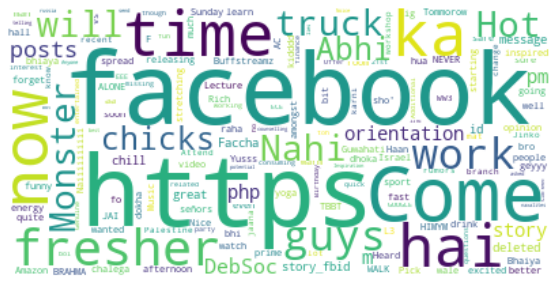

Sender Deepak Bhaiya changed the subject from "BrahmaputraFreshers_19-23" to "BrahmaFreshersUnoff_19-23"


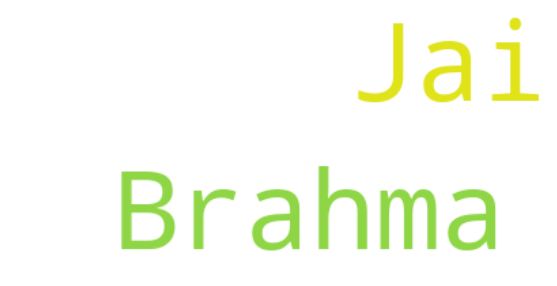

Sender +91 93810 43215


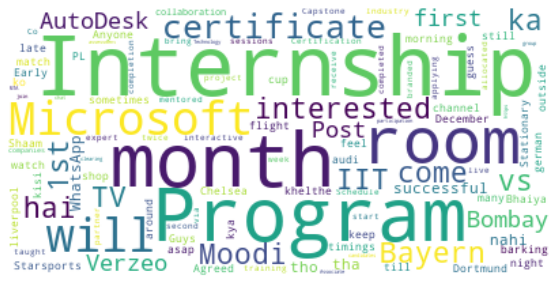

Sender Rahul


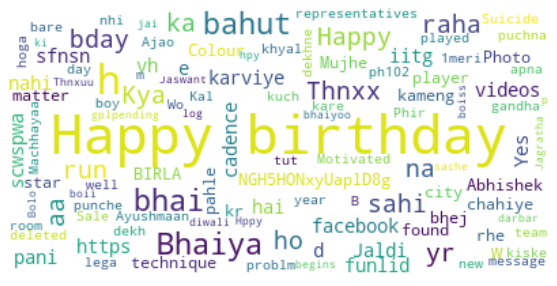

Sender +91 99229 72751


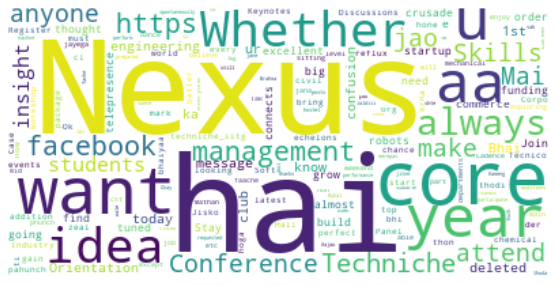

Sender Pawan Brahmaputra


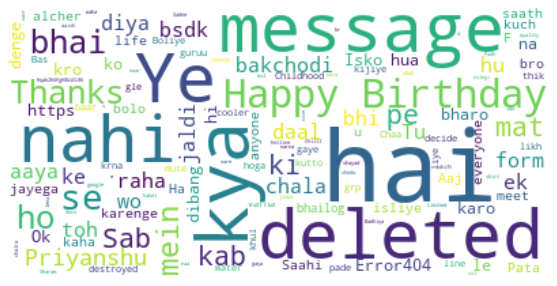

Sender +91 6290 623 436


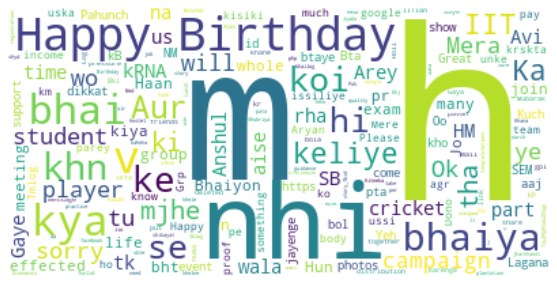

Sender +91 94471 94433


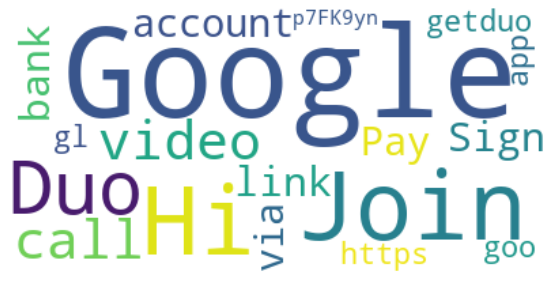

Sender +91 6394 834 104


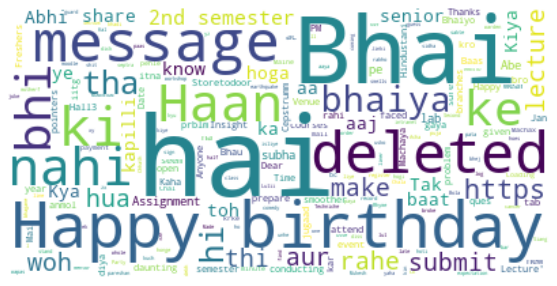

Sender +91 95733 84138


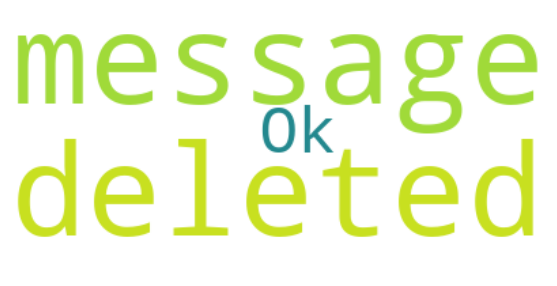

Sender Deepak Bhaiya added Anshul


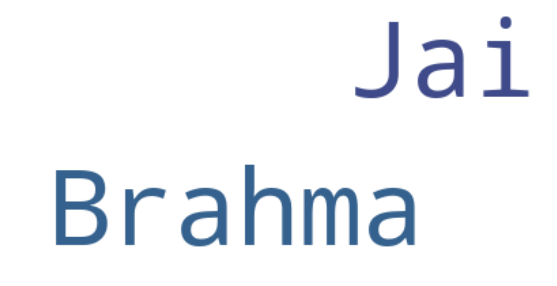

Sender +91 84728 92041


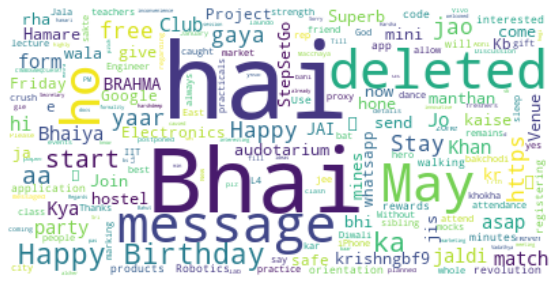

Sender +91 96330 59095 left


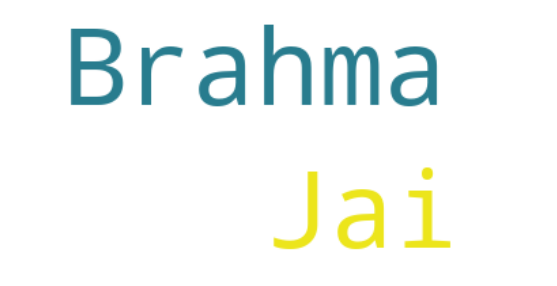

Sender Manish Mnc


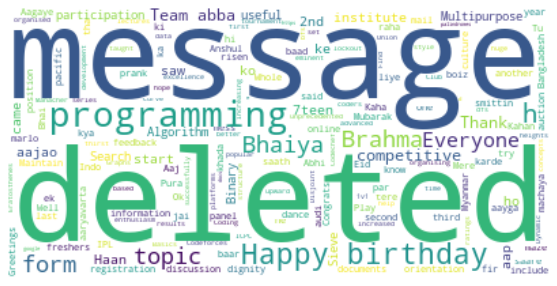

Sender Bhavesh


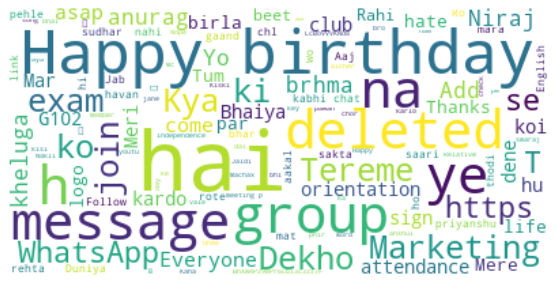

Sender +91 94629 89044


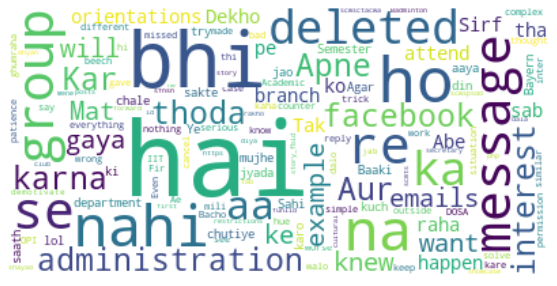

Sender Uday Brahma Cse changed the group description


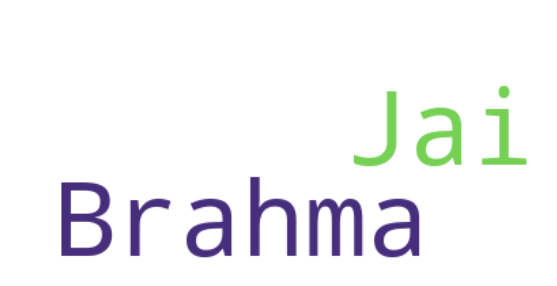

Sender +91 80732 30137


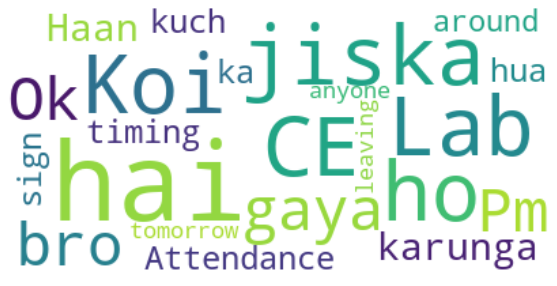

Sender Anish


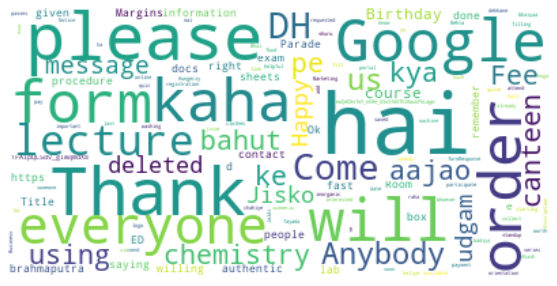

Sender +91 97551 03340 changed to +91 76378 35010


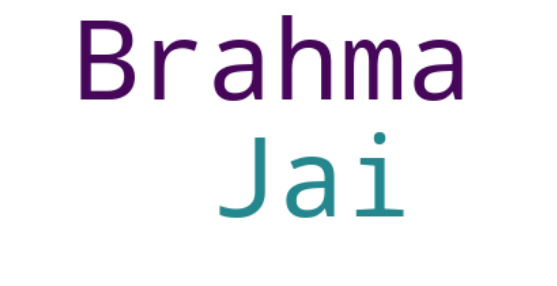

Sender Anshul


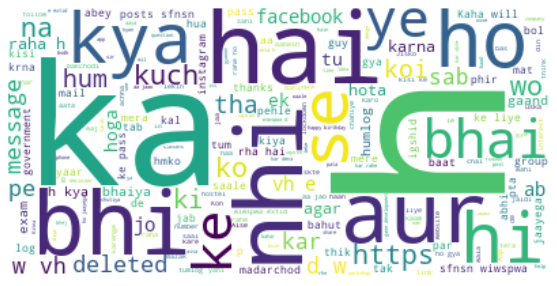

Sender +91 80809 70700


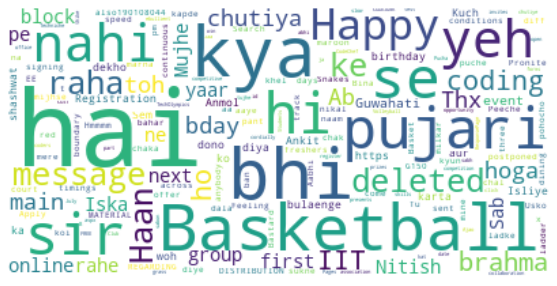

Sender +234 907 764 4594 joined using this group's invite link


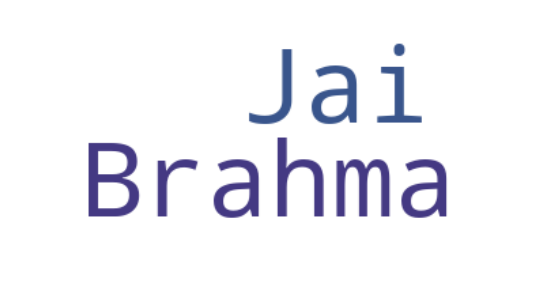

Sender +91 87700 34378 added +91 88891 91789


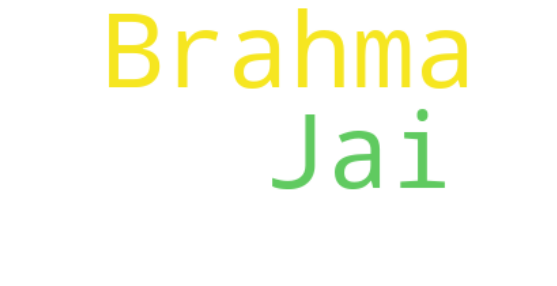

Sender +91 99541 64227


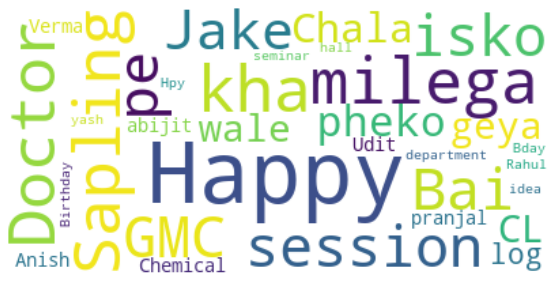

Sender +91 86881 24278


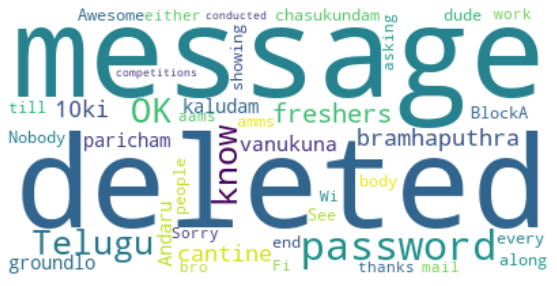

Sender +91 76378 34925


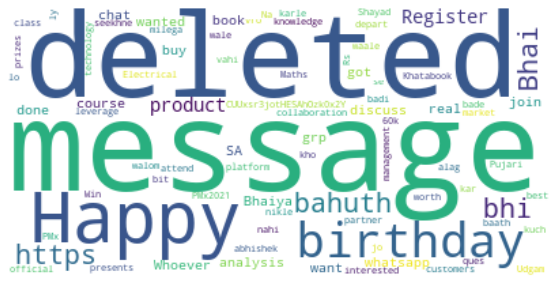

Sender +91 93816 20919


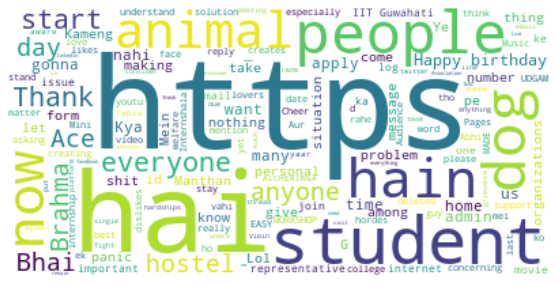

Sender +91 6371 114 763


ValueError: We need at least 1 word to plot a word cloud, got 0.

In [45]:
l = messages_df.sender.unique()
for i in range(len(l)):
    dummy_df = messages_df[messages_df['sender'] == l[i]]
    text = " ".join(review for review in dummy_df.text_message)
    stopwords = set(STOPWORDS)
    stopwords.update(["kya", "message", "deleted", "hai", "tha", "ki"])
    
    print('Sender', l[i])
    
    wordcloud = WordCloud(background_color="white").generate(text)
   
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()